In [1]:
import pandas as pd
import numpy as np
import re
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns

In [2]:
#Reading the data
df = pd.read_excel('Book1.xlsx')

In [3]:
#Finding missing percentage
percent_missing = (df.isnull().sum() / len(df)) * 100
print(percent_missing)

bookId               0.000000
title                0.000000
series              55.276497
author               0.000000
rating               0.000000
description          2.549640
language             7.252563
isbn                 0.000000
genres               0.000000
characters           0.000000
bookFormat           2.806891
edition             90.557948
pages                4.472350
publisher            7.042951
publishDate          1.676893
firstPublishDate    40.637982
awards               0.000000
numRatings           0.000000
ratingsByStars       0.000000
likedPercent         1.185259
setting              0.000000
coverImg             1.152864
bbeScore             0.000000
bbeVotes             0.000000
price               27.373376
dtype: float64


In [4]:
#Getting Data information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52478 entries, 0 to 52477
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   bookId            52478 non-null  object 
 1   title             52478 non-null  object 
 2   series            23470 non-null  object 
 3   author            52478 non-null  object 
 4   rating            52478 non-null  float64
 5   description       51140 non-null  object 
 6   language          48672 non-null  object 
 7   isbn              52478 non-null  object 
 8   genres            52478 non-null  object 
 9   characters        52478 non-null  object 
 10  bookFormat        51005 non-null  object 
 11  edition           4955 non-null   object 
 12  pages             50131 non-null  object 
 13  publisher         48782 non-null  object 
 14  publishDate       51598 non-null  object 
 15  firstPublishDate  31152 non-null  object 
 16  awards            52478 non-null  object

In [5]:
# Check for duplicates
duplicates = df.duplicated()
# Get the rows that are duplicates
duplicate_rows = df[duplicates]
#print(duplicate_rows)
df.drop_duplicates(inplace=True)

In [6]:
#Cleaning the columns to relevant datatypes and removing spaces etc
#to use proper data for the visuals to be created later
def clean_ratings_column(df, col_name):
    df[col_name] = df[col_name].apply(lambda x: (x.strip('[]')))
    df[col_name] = df[col_name].str.replace(',','')
    df[col_name] = df[col_name].str.replace("'",'')
    df[col_name] = df[col_name].replace("",0)


In [7]:
new = clean_ratings_column(df, 'ratingsByStars')

In [47]:
#function to split ratings into numerical valued columns
def split_column(df, col_name):
    new = df[col_name].str.split(" ", n=5, expand=True)
    df['1star'] = new[0]
    df['2star'] = new[1]
    df['3star'] = new[2]
    df['4star'] = new[3]
    df['5star'] = new[4]

In [48]:
split_column(df, 'ratingsByStars')


In [10]:
#filling NA values in missing data places
def fillna_and_convert_to_int(df, col_names):
    for col_name in col_names:
        df[col_name] = df[col_name].fillna(0)
        df[col_name] = df[col_name].astype(int)


In [11]:
col_names = ['1star', '2star', '3star', '4star', '5star']
fillna_and_convert_to_int(df, col_names)


In [11]:
df['edition'] = df.apply(lambda row: row['title'] + '_' + 'v1' if pd.isnull(row['edition']) else row['edition'], axis=1)
df['series'] = df.apply(lambda row: row['title'] + '_' + 'v1' if pd.isnull(row['series']) else row['series'], axis=1)

In [13]:
df['publishDate'] = pd.to_datetime(df['publishDate'], errors='coerce')
df['publishedYear'] = df['publishDate'].dt.year
df['publishedYear'] = df['publishedYear'].fillna(df['publishedYear'].median())
df['publishedYear'] = df['publishedYear'].astype(int)


In [14]:
df['pages'] = df['pages'].str.replace(r'\D', '')

C:\Users\sahan\AppData\Local\Temp\ipykernel_14108\4060854982.py:1: FutureWarning: The default value of regex will change from True to False in a future version.
  df['pages'] = df['pages'].str.replace(r'\D', '')


In [15]:
df['pages'] = pd.to_numeric(df['pages'], errors='coerce').fillna(df['pages'].median()).astype(int)

In [16]:
df['price'] = pd.to_numeric(df['price'], errors='coerce', downcast='float')

In [17]:
df['price'] = df['price'].fillna(df['price'].median())

In [18]:
df['price'].describe()

count    52428.000000
mean         8.436124
std         20.805014
min          0.840000
25%          3.720000
50%          5.200000
75%          6.572500
max        898.640015
Name: price, dtype: float64

In [19]:
df['bookFormat'].describe()

count         50955
unique          136
top       Paperback
freq          26748
Name: bookFormat, dtype: object

In [21]:
def fillna(df, col_names):
    for col_name in col_names:
        df[col_name] = df[col_name].fillna('Not Available')

In [22]:
colnames = ['description','language','publisher']

In [23]:
fillna(df,colnames)

In [24]:
df['bookFormat'] = df['bookFormat'].fillna(df['bookFormat'].mode()[0])

In [25]:
delete_columns = ['publishDate','firstPublishDate','isbn','likedPercent','coverImg']

In [26]:
df = df.drop(delete_columns, axis = 1)

In [27]:
df.isna().sum()


bookId               0
title                0
series               0
author               0
rating               0
description          0
language             0
genres               0
characters           0
bookFormat           0
edition              0
pages                0
publisher            0
awards               0
numRatings           0
ratingsByStars       0
setting              0
bbeScore             0
bbeVotes             0
price                0
1star             1422
2star             1422
3star             1422
4star             1422
5star             1422
publishedYear        0
dtype: int64

In [27]:
df.dtypes == 'object'

bookId             True
title              True
series             True
author             True
rating            False
description        True
language           True
genres             True
characters         True
bookFormat         True
edition            True
pages             False
publisher          True
awards             True
numRatings        False
ratingsByStars     True
setting            True
bbeScore          False
bbeVotes          False
price             False
1star             False
2star             False
3star             False
4star             False
5star             False
publishedYear     False
dtype: bool

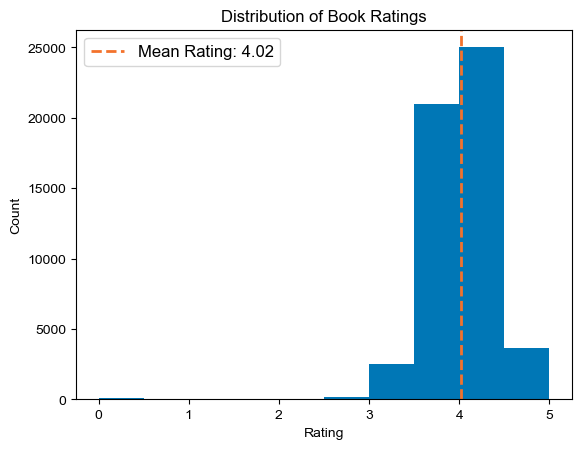

In [28]:
#Distribution of Book Ratings
plt.hist(df['rating'], bins=10, color='#0077B6')
plt.xlabel('Rating')
plt.ylabel('Count')
plt.title('Distribution of Book Ratings')
#vertical lines for mean rating
mean_rating = df['rating'].mean()
plt.axvline(mean_rating, color='#F3722C', linestyle='dashed', linewidth=2, label=f'Mean Rating: {mean_rating:.2f}')
#add legends
plt.legend(fontsize=12)
# Set style
sns.set_style("whitegrid")


plt.show()



In [30]:
#Top 5 languages
lang_list = list(df["language"].value_counts().index[:5])
lang_values = [df["language"].value_counts().iloc[i] for i in range(len(lang_list))]
fig = px.pie(df,
             values=lang_values,
             names=lang_list)
fig.update_layout(title='Top 5 Languages')
fig.show()


In [31]:
#Book format distribution
format_counts = df['bookFormat'].value_counts()

fig = px.pie(format_counts, 
             names=format_counts.index, 
             values=format_counts.values, 
             hole=0.5,
             color_discrete_sequence=px.colors.qualitative.Pastel,
             labels={'label': 'Format', 'value': 'Count'})

fig.update_traces(textposition='inside', 
                  textinfo='percent+label',
                  marker=dict(line=dict(color='#FFFFFF', width=1)))

fig.update_layout(title='Book Format Distribution',
                  font=dict(family='Arial', size=18, color='#333333'))

fig.show()



In [32]:
#scatterplot for rating vs price
fig = px.scatter(df, x='numRatings', y='price', trendline='ols', 
                 color='rating', size='rating', hover_data=['title'])
fig.update_layout(title='Number of Ratings vs. Price',
                  xaxis_title='Number of Ratings',
                  yaxis_title='Price')
fig.show()



In [33]:
#Top 10 genres
top_genres = df['genres'].str.split(',', expand=True).stack().value_counts()[:10]
colors = ['red', 'orange', 'yellow', 'green', 'blue', 'purple', 'pink', 'brown', 'gray', 'black']
fig = px.bar(top_genres, x=top_genres.index, y=top_genres.values, color=colors)
fig.update_layout(title='Top 10 Most Frequent Genres')
fig.update_xaxes(title='Genre')
fig.update_yaxes(title='No. of Books (count)')
fig.show()


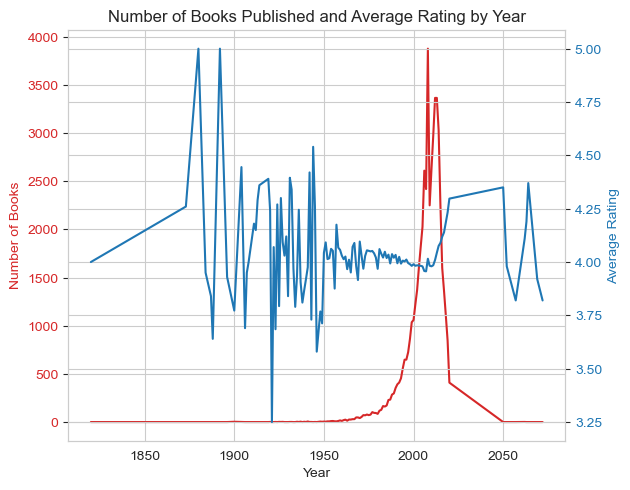

In [34]:
# Convert publishedYear to datetime
df['publishedYear'] = pd.to_datetime(df['publishedYear'], format='%Y', errors='coerce')

# Calculate the number of books published each year
books_by_year = df.groupby(df['publishedYear'].dt.year).size()

# Calculate the average rating by year
avg_rating_by_year = df.groupby(df['publishedYear'].dt.year).agg({'rating': 'mean'})

# Plot the results
fig, ax1 = plt.subplots()

color = 'tab:red'
ax1.set_xlabel('Year')
ax1.set_ylabel('Number of Books', color=color)
ax1.plot(books_by_year.index, books_by_year.values, color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()

color = 'tab:blue'
ax2.set_ylabel('Average Rating', color=color)
ax2.plot(avg_rating_by_year.index, avg_rating_by_year['rating'], color=color)
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()
plt.title('Number of Books Published and Average Rating by Year')
plt.show()


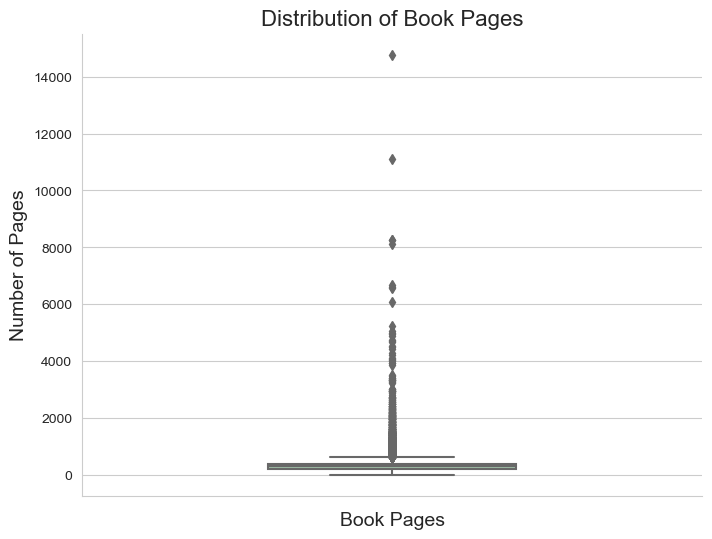

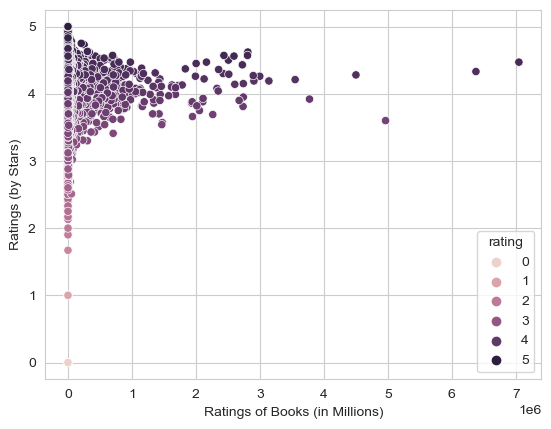

In [36]:
# ANALYSIS (EDA) 

# create a box plot with customizations
fig, ax = plt.subplots(figsize=(8, 6))
sns.boxplot(data=df, y='pages', ax=ax, color='#99c2a2', width=0.4)
ax.set_xlabel('Book Pages', fontsize=14)
ax.set_ylabel('Number of Pages', fontsize=14)
ax.set_title('Distribution of Book Pages', fontsize=16)
sns.despine()
plt.show()

# Plot scatterplot of ratings vs numRatings
sns.scatterplot(data=df, x='numRatings', y='rating', hue = 'rating', cmap='hotpink')
plt.xlabel('Ratings of Books (in Millions)')
plt.ylabel('Ratings (by Stars)')
plt.show()


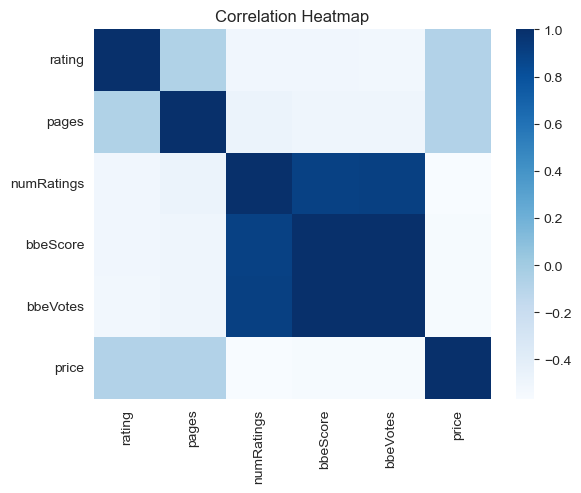

In [49]:
# HEATMAP
# Select the relevant columns for correlation analysis
#df_corr = df[['rating', 'pages', 'numRatings', 'ratingsByStars', 'publishedYear']]
df_corr = df[['rating', 'pages', 'numRatings', 'bbeScore','bbeVotes', 'price', '1star', '2star', '3star', '4star', 
              '5star','title', 'description', 'publishedYear']].corr()


# Compute the correlation matrix
corr_matrix = df_corr.corr()

# Plot the heatmap
sns.heatmap(corr_matrix, cmap='Blues')
plt.title('Correlation Heatmap')
plt.show()

In [38]:
#INSTALL IF NOT DONE
pip install jupyter-dash

Note: you may need to restart the kernel to use updated packages.


In [ ]:
pip install gunicorn

In [40]:
#Creating a simple dashboard projecting some of the key metrics/visuals created
#NOTE: The dashboard is opened in the output generated below as "Dash is running on http://127.0.0.1:8050/"
#TO STOP THE PROJECT WE NEED TO COME BACK TO THE JUPYTER AND STOP THE EXECUTION SINCE IT'S STILL RUNNING IN LOCALHOST

import dash
import dash_core_components as dcc
import dash_html_components as html
import plotly.express as px
import pandas as pd


# Calculate the metrics
top_genres = df['genres'].str.split(',', expand=True).stack().value_counts()[:10]
publisher_group = df.groupby('publisher').agg({'rating': 'mean', 'numRatings': 'sum'})
publisher_group = publisher_group.sort_values(by='rating', ascending=False).head(10)
lang_list = list(df["language"].value_counts().index[:5])
lang_values = [df["language"].value_counts().iloc[i] for i in range(len(lang_list))]

# Create the visualizations
fig1 = px.bar(top_genres, x=top_genres.index, y=top_genres.values)
fig1.update_layout(title='Top 10 Most Frequent Genres')

fig2 = px.bar(publisher_group, x=publisher_group.index, y='rating')
fig2.update_layout(title='Top 10 Highest-Rated Publishers')

fig3 = px.pie(values=lang_values, names=lang_list)
fig3.update_layout(title='Top 5 Most Common Languages')

# Create the dashboard layout
app = dash.Dash(__name__)
app.layout = html.Div(children=[
    html.H1(children='Good Reads Metrics Dashboard'),
    html.Div(children='''
        A dashboard displaying key metrics from the Good Reads dataset.
    '''),
    dcc.Graph(
        id='top-genres-graph',
        figure=fig1
    ),
    dcc.Graph(
        id='top-publishers-graph',
        figure=fig2
    ),
    dcc.Graph(
        id='top-languages-graph',
        figure=fig3
    )
])

# Run the app
if __name__ == '__main__':
    app.run_server(port=8050)

Dash is running on http://127.0.0.1:8050/

 * Serving Flask app "__main__" (lazy loading)
 * Environment: production
   Use a production WSGI server instead.
 * Debug mode: off


 * Running on http://127.0.0.1:8050/ (Press CTRL+C to quit)
